# Basic Filtering


In this exercise, we will use some of the basic filters seen in the lecture. For this, we will need the following python packages: 

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack


All the exercise is based on the OpenCV framework. You can check the following link for the implementations of the main filters: https://docs.opencv.org/2.4/modules/imgproc/doc/filtering.html

   ## Histogram Equalization
   
We will apply histogram equalization (see https://docs.opencv.org/3.4/d6/dc7/group__imgproc__hist.html#ga7e54091f0c937d49bf84152a16f76d6e). We will first load an image and show its histogram. 

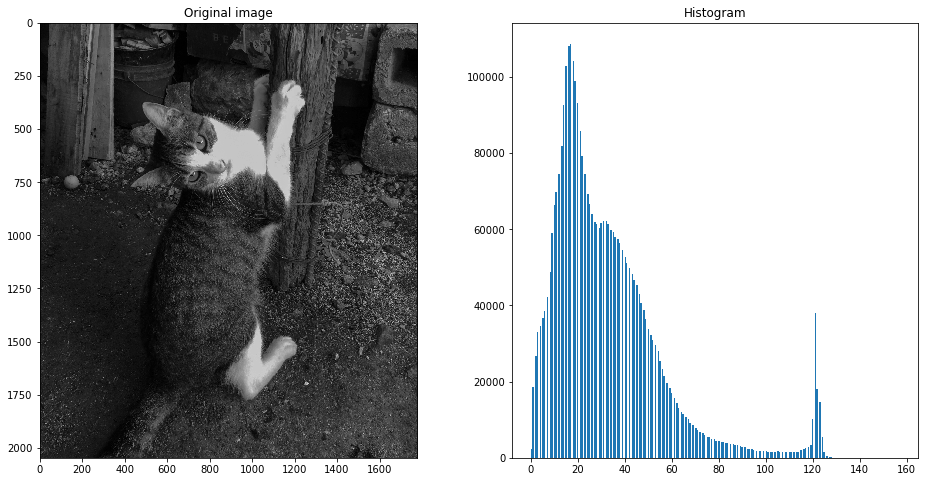

In [2]:

# New in OpenCV? we can load an image using this method. All our images are in the folder img. The 0 means that 
# we want a grayscale image (with only one channel).
img_cat = cv2.imread('img/cat.jpg',0)

# We plot our image
fig = plt.figure(figsize = (16,8)) # Creating a figure
ax1 = fig.add_subplot(121) # Adding a subplot for side by side view (1 row, two columns, our firs subplot)
ax1.imshow(img_cat, interpolation='none',  cmap='gray') # We show our cat 
ax1.set_title('Original image') # Give a name to your Subplot

ax2 = fig.add_subplot(122) # Adding a second subplot to our figure (1 row, two columns, our second subplot)
ax2.hist(img_cat.ravel(), bins=256) # Here we add the histogram, but we could also show another image.
ax2.set_title('Histogram') # This is our histogram

# You can add more subplots to your figure the same way, but you would need to change the parameter for subplot.

plt.show() # Once we have are all set, we show the figure. 



Now, we know how to load images and plot histograms (or images), now it is time to equalize. 

**Exercise 1.**  Take a look at the previous link and use the OpenCV functions to equalize the histogram. Show the results and compare the resulting images and histograms.

Text(0.5, 1.0, 'Image wavg')

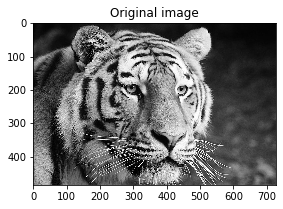

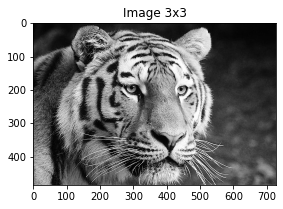

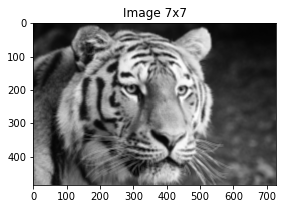

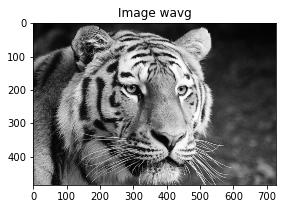

In [31]:
#TODO: Load your image and create your kernels
img_tiger = cv2.imread('img/tiger.jpg')

#Filter kernels 
avg_kernel1 = np.ones((3,3), np.float32) / 9 #Divided by 9 for the filter values
avg_kernel7 = np.ones((7,7), np.float32) / 49

wavg_kernel = np.array([[1,2,1], [2,4,2], [1,2,1]], np.float32) / 16

# TODO: Apply the convolution operation and show your results
tiger_avg1 = cv2.filter2D(src = img_tiger, ddepth = -1, kernel = avg_kernel1) 
tiger_avg2 = cv2.filter2D(src = img_tiger, ddepth = -1, kernel = avg_kernel7)

tiger_wavg = cv2.filter2D(src = img_tiger, ddepth = -1, kernel = wavg_kernel)

#Original image
fig = plt.figure(figsize = (20,20))
ax1 = fig.add_subplot(141)
ax1.imshow(img_tiger, interpolation = 'none', cmap = 'gray')
ax1.set_title('Original image')

#Filter image
fig = plt.figure(figsize = (20,20))
ax2 = fig.add_subplot(142)
ax2.imshow(tiger_avg1, interpolation = 'none', cmap = 'gray')
ax2.set_title('Image 3x3')

#Filter image
fig = plt.figure(figsize = (20,20))
ax3 = fig.add_subplot(143)
ax3.imshow(tiger_avg2,interpolation = 'none', cmap = 'gray')
ax3.set_title('Image 7x7')

#Filter image
fig = plt.figure(figsize = (20,20))
ax4 = fig.add_subplot(144)
ax4.imshow(tiger_wavg, interpolation = 'none', cmap = 'gray')
ax4.set_title('Image wavg')



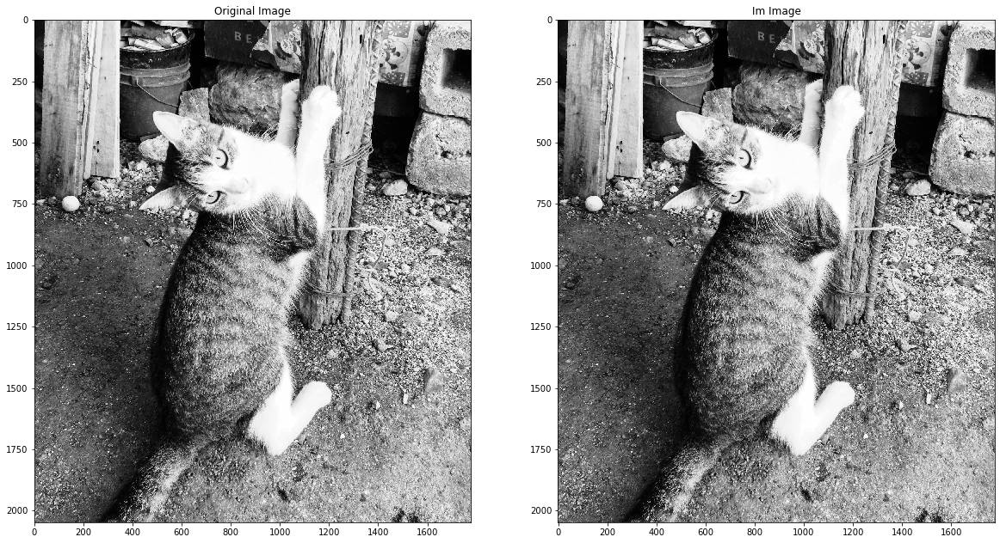

Text(0.5, 1.0, 'Original histogram')

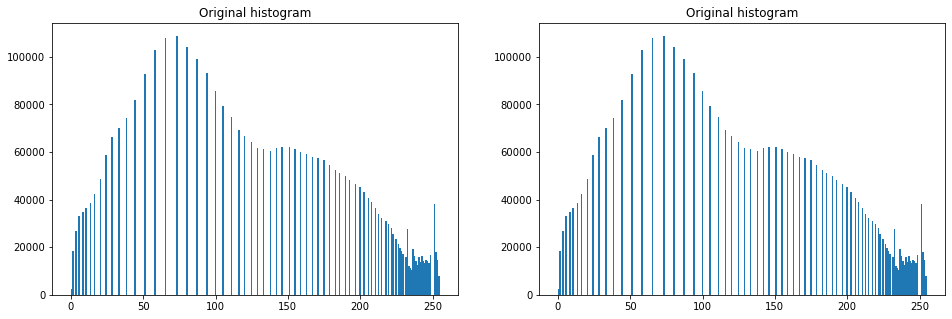

In [13]:
#TODO: Eq. the image's histogram
img_cat_eq = cv2.equalizeHist(img_cat)



#TODO: Plot the results and compare the figures and histograms. 
fig = plt.figure(figsize=(20,20))

axl = fig.add_subplot(121)
axl.imshow(img_cat, interpolation = 'none', cmap = 'gray')
axl.set_title('Original Image')

ax2 = fig.add_subplot(122)
ax2.imshow(img_cat_eq, interpolation = 'none', cmap = 'gray')
ax2.set_title('Im Image')
plt.show()

fig2 = plt.figure(figsize = (16,5))
ax21 = fig2.add_subplot(121)
ax21.hist(img_cat.ravel(), bins=256)
ax21.set_title('Original histogram')

ax22 = fig2.add_subplot(122)
ax22.hist(img_cat_eq.ravel(), bins=256)
ax22.set_title('Original histogram')



## Blurring/Smoothing

Now we will evaluate the effect of the filters in an image.

**Exercise 2.** Load the image `tiger.jpg`. Then apply the averaging filter. 
* For this, create a $3 \times 3$ (and $7 \times 7$) numpy matrix and fill it with the adequate values. This will be our kernel for the filter.
* Create a $3 \times 3$ numpy matrix and fill it with the values of the weighted averaging filter.
* Use the `cv2.filter2D` function to apply the convolution of the image with the filters.
* Show and compare the results.

OpenCV (and other frameworks) already have implementations for the filters. Now, we will use these methods for applying a Gaussian filter to our tiger.

**Exercise 3.** Use OpenCV to apply a Gaussian filter. Try with different values of sigma and compare the results. 

Text(0.5, 1.0, 'Image very blurred')

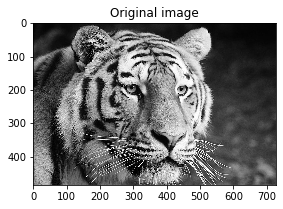

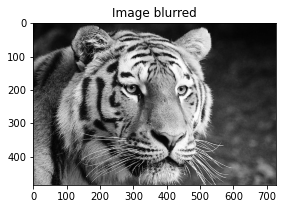

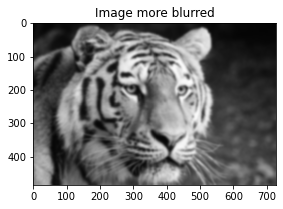

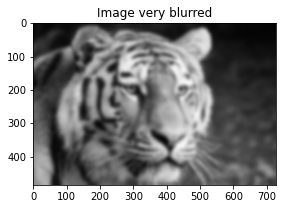

In [33]:
# TODO: Apply the filter and show the results

tiger_blurred = cv2.GaussianBlur(src = img_tiger, ksize=(0,0), sigmaX = 1)
tiger_more_blurred = cv2.GaussianBlur(src = img_tiger, ksize=(0,0), sigmaX = 3)

tiger_very_blurred = cv2.GaussianBlur(src = img_tiger, ksize=(0,0), sigmaX = 5)

#Original image
fig = plt.figure(figsize = (20,20))
ax1 = fig.add_subplot(141)
ax1.imshow(img_tiger, interpolation = 'none', cmap = 'gray')
ax1.set_title('Original image')

#Filter image
fig = plt.figure(figsize = (20,20))
ax2 = fig.add_subplot(142)
ax2.imshow(tiger_blurred, interpolation = 'none', cmap = 'gray')
ax2.set_title('Image blurred')

#Filter image
fig = plt.figure(figsize = (20,20))
ax3 = fig.add_subplot(143)
ax3.imshow(tiger_more_blurred,interpolation = 'none', cmap = 'gray')
ax3.set_title('Image more blurred')

#Filter image
fig = plt.figure(figsize = (20,20))
ax3 = fig.add_subplot(144)
ax3.imshow(tiger_very_blurred,interpolation = 'none', cmap = 'gray')
ax3.set_title('Image very blurred')

plt.show()

## Denoising

We can use the filters to reduce the effects of noise in the image, however, as we saw before, this will also affect some elements of the image. 

**Exercise 4.** Now we will see the effects of the filters on a noisy image.
* Load the image `city.jpg`. 
* Write a function to add salt and pepper noise to the image. To do this, just randomly select a small portion of the pixels of the image and (again, randomly) change its value to 0 or 255.
* Show the results (clean and noisy image).

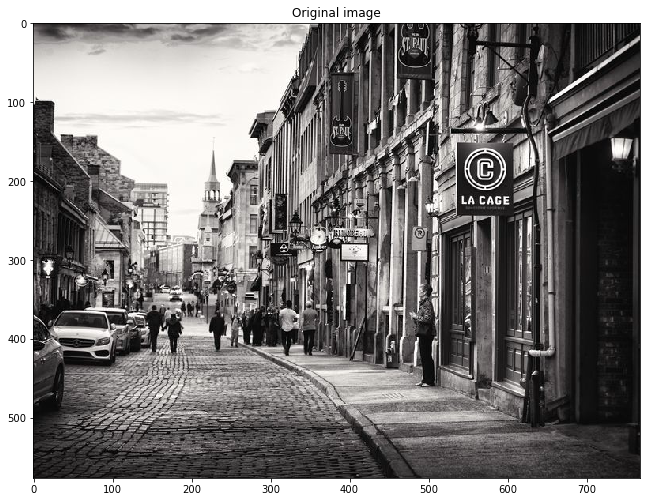

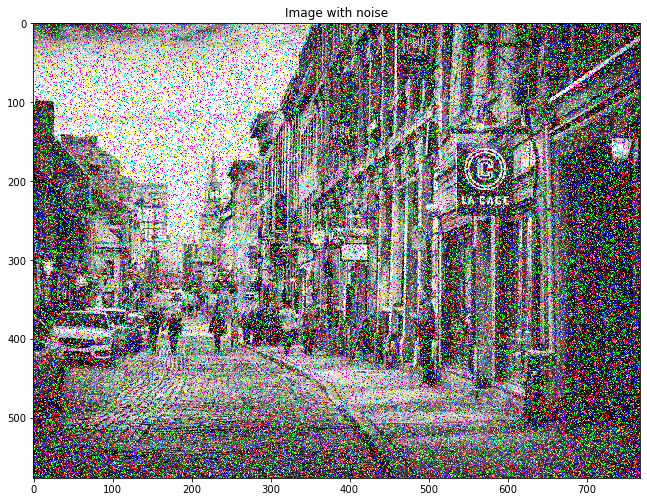

In [41]:
def salt_pepper_noise(img):
    # TODO Create your noisy image here
    
    salt = np.random.uniform(low = 0.0, high = 1.0, size = img.shape)
    pepper = np.random.uniform(low = 0.0, high = 1.0, size = img.shape)
    
    noisy_image = np.copy(img)
    
    noisy_image[np.where(salt > 0.8)] = 255
    noisy_image[np.where(pepper > 0.9)] = 0
    
    return noisy_image

# TODO: Load and add noise to your image. Show the results. 
img_city = cv2.imread('img/city.jpg')
noisy_city = salt_pepper_noise(img_city)

#Original image
fig = plt.figure(figsize = (50,50))
ax1 = fig.add_subplot(141)
ax1.imshow(img_city, interpolation = 'none', cmap = 'gray')
ax1.set_title('Original image')

#Filter image
fig = plt.figure(figsize = (50,50))
ax2 = fig.add_subplot(142)
ax2.imshow(noisy_city, interpolation = 'none', cmap = 'gray')
ax2.set_title('Image with noise')

plt.show()

**Exercise 5.** Now that we have noise in our image, use OpenCV to apply a Gaussian, Averaging, and Median filter to the (noisy) image. Compare the results with the clean input. Show your results. 

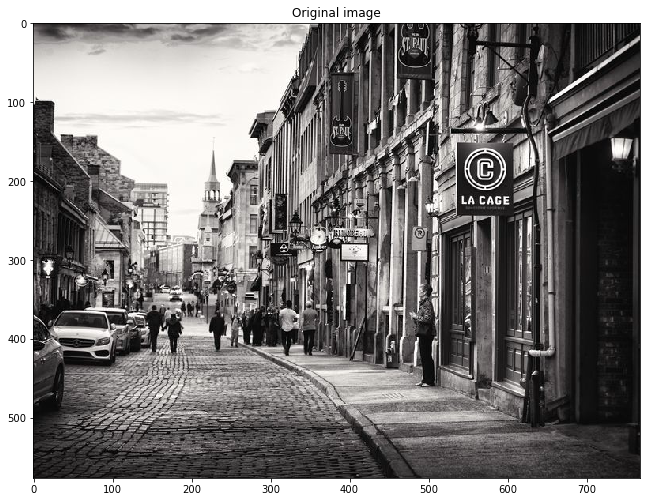

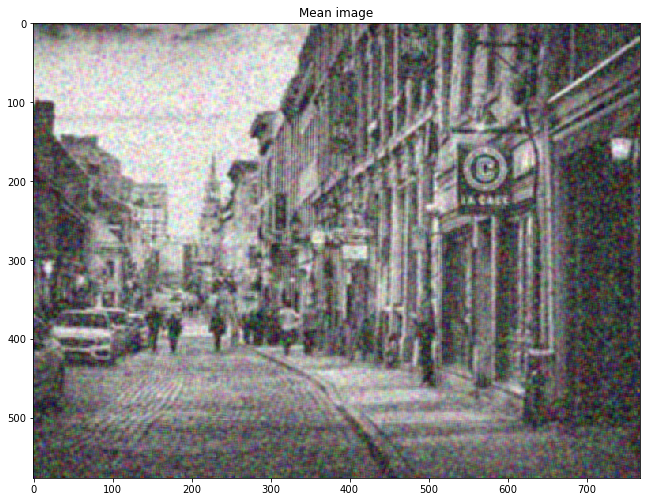

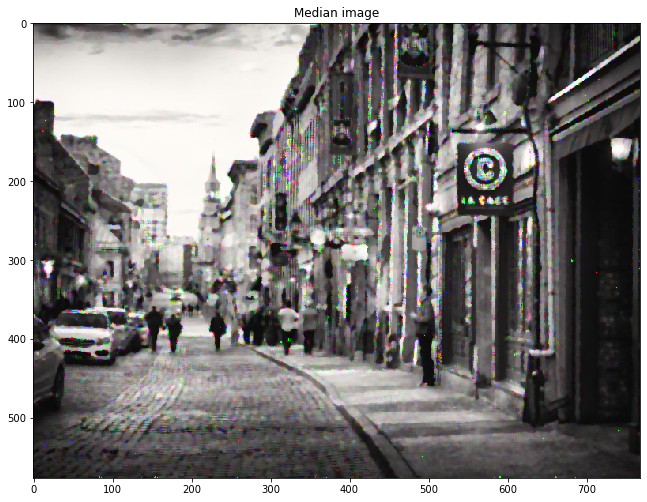

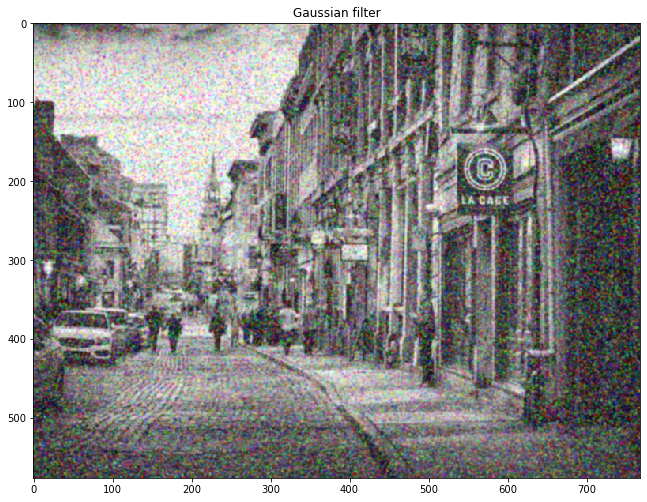

In [43]:
#TODO: 

img_gaussian = cv2.GaussianBlur(src = noisy_city, ksize = (0,0), sigmaX = 1)

img_mean = cv2.blur(src = noisy_city, ksize=(5,5))
img_meadian = cv2.medianBlur(src = noisy_city, ksize = 5)

#[YOUR CODE HERE]

#Original image
fig = plt.figure(figsize = (50,50))
ax1 = fig.add_subplot(141)
ax1.imshow(img_city, interpolation = 'none', cmap = 'gray')
ax1.set_title('Original image')

#Filter image
fig = plt.figure(figsize = (50,50))
ax2 = fig.add_subplot(142)
ax2.imshow(img_mean, interpolation = 'none', cmap = 'gray')
ax2.set_title('Mean image')


#Filter image
fig = plt.figure(figsize = (50,50))
ax2 = fig.add_subplot(143)
ax2.imshow(img_meadian, interpolation = 'none', cmap = 'gray')
ax2.set_title('Median image')

#Filter image
fig = plt.figure(figsize = (50,50))
ax2 = fig.add_subplot(144)
ax2.imshow(img_gaussian, interpolation = 'none', cmap = 'gray')
ax2.set_title('Gaussian filter')

plt.show()

Let's try with a different kind of noise. The next code loads and image of our city with Gaussian noise. 

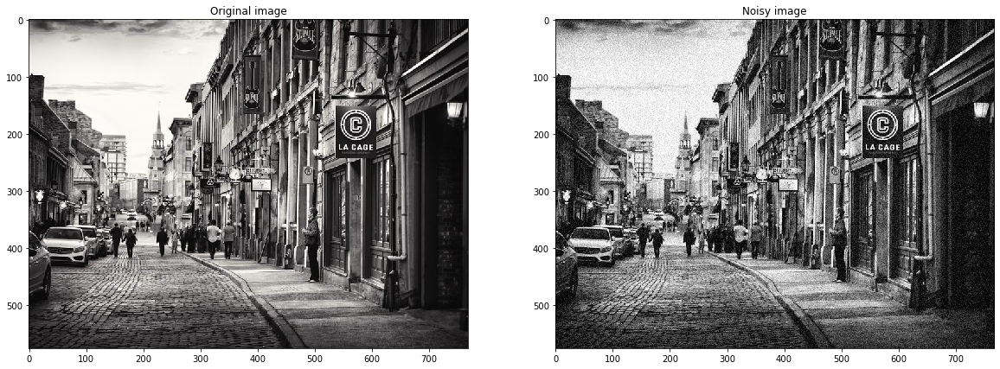

In [44]:
city_noisy = cv2.imread('img/city_noisy.jpg',0)



fig = plt.figure(figsize = (20,20))
ax1 = fig.add_subplot(121)
ax1.imshow(img_city, interpolation='none',  cmap='gray')
ax1.set_title('Original image')

ax2 = fig.add_subplot(122)
ax2.imshow(city_noisy, interpolation='none',  cmap='gray')
ax2.set_title('Noisy image')
plt.show()






**Exercise 6.** Compare the Gaussian and bilateral filters. Apply the filters to the `city_noisy.jpg` image and show the results. Try with different values for sigma.  

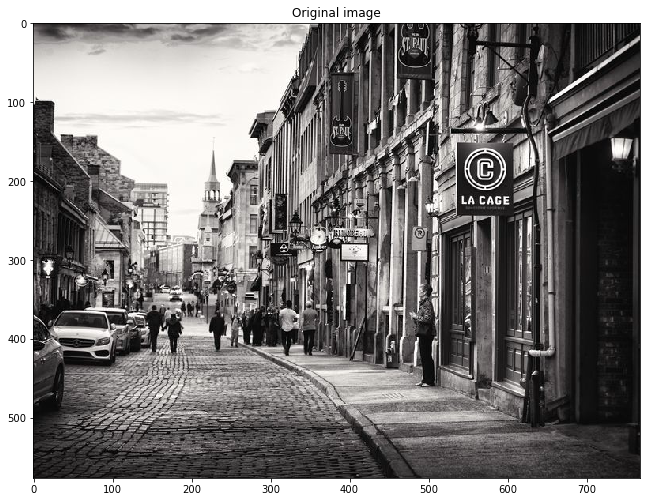

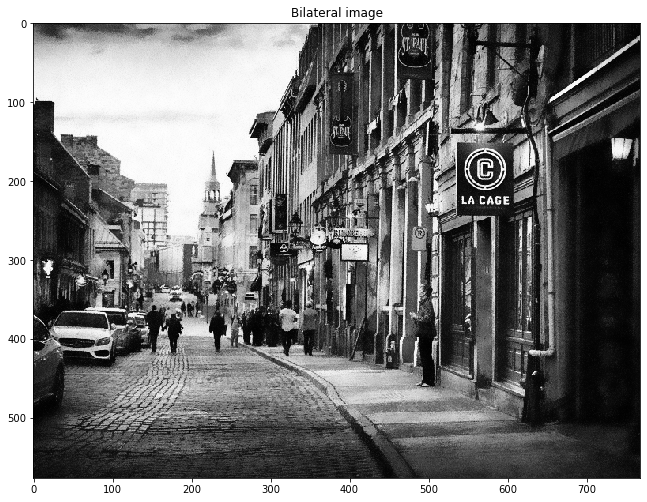

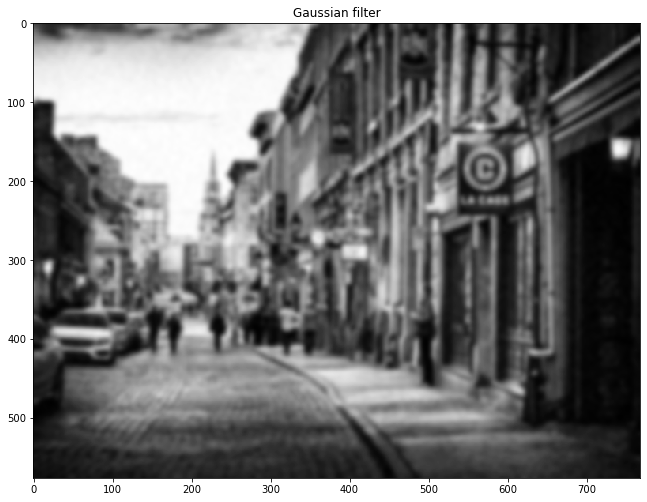

In [50]:
#TODO: Exercise 6 goes here!

#img_city_noisy = cv2.imread('data/city_noisy.jpg')
city_gaussian = cv2.GaussianBlur(src = city_noisy, ksize = (0,0), sigmaX = 3)
city_bileteral = cv2.bilateralFilter(src= city_noisy, d = -1, sigmaColor = 30, sigmaSpace = 6)


#Original image
fig = plt.figure(figsize = (50,50))
ax1 = fig.add_subplot(141)
ax1.imshow(img_city, interpolation = 'none', cmap = 'gray')
ax1.set_title('Original image')

#Filter image
fig = plt.figure(figsize = (50,50))
ax2 = fig.add_subplot(143)
ax2.imshow(city_bileteral, interpolation = 'none', cmap = 'gray')
ax2.set_title('Bilateral image')

#Filter image
fig = plt.figure(figsize = (50,50))
ax2 = fig.add_subplot(144)
ax2.imshow(city_gaussian, interpolation = 'none', cmap = 'gray')
ax2.set_title('Gaussian filter')

plt.show()


## Sobel Filter

Finally, we will evaluate a derivative filter, specifically the Sobel filters. Let´s load an image:

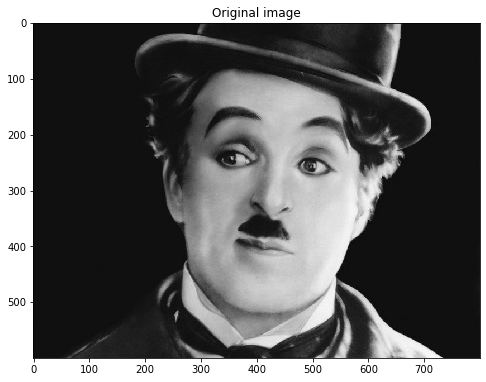

In [51]:
img_chaplin = cv2.imread('img/Charlie_Chaplin.jpg',0)

fig = plt.figure(figsize = (8,8))
ax1 = fig.add_subplot(111)
ax1.imshow(img_chaplin, interpolation='none',  cmap='gray')
ax1.set_title('Original image')
plt.show()

**Exercise 7.** Apply the Sobel filter on the `Charlie_Chaplin.jpg` image. 
* Create a kernel for the horizontal and vertical gradient filters (remember exercise 2?)
* Apply the convolution operation on the image with each filter.
* Compute the magnitude of the gradient. 
* Show the gradient filters and the magnitude. 

**Hint:** You will need to change the type of the image matrix from `uint` to `float` before applying these filters. 

Text(0.5, 1.0, 'Magnitude G')

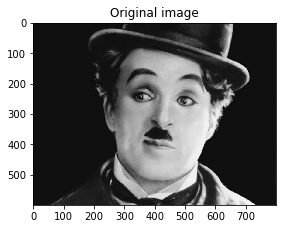

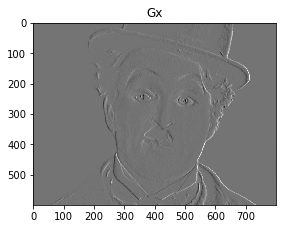

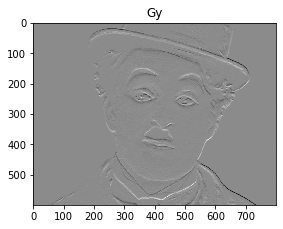

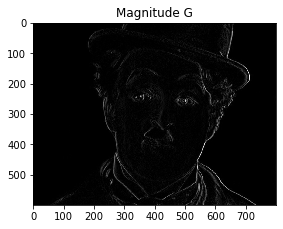

In [59]:
#TODO: Exercise 7!

sobel_kernel_x = np.array([[1,0,-1], [2,0,-2], [1,0,-1]])
sobel_kernel_y = np.array([[1,2,1], [0,0,0], [-1,-2,-1]])

gx = cv2.filter2D(src = img_chaplin.astype(np.float), ddepth = -1, kernel = sobel_kernel_x)
gy= cv2.filter2D(src = img_chaplin.astype(np.float), ddepth = -1, kernel = sobel_kernel_y)

#We apply a kernel that can have negative values. That's why we change the type of the image to a float

g_magnitude = np.sqrt(np.power(gx,2), np.power(gy,2))

#Original image
fig = plt.figure(figsize = (20,20))
ax1 = fig.add_subplot(141)
ax1.imshow(img_chaplin, interpolation = 'none', cmap = 'gray')
ax1.set_title('Original image')

#Filter image
fig = plt.figure(figsize = (20,20))
ax3 = fig.add_subplot(142)
ax3.imshow(gx, interpolation = 'none', cmap = 'gray')
ax3.set_title('Gx')

#Filter image
fig = plt.figure(figsize = (20,20))
ax4 = fig.add_subplot(142)
ax4.imshow(gy, interpolation = 'none', cmap = 'gray')
ax4.set_title('Gy')

#Filter image
fig = plt.figure(figsize = (20,20))
ax5 = fig.add_subplot(142)
ax5.imshow(g_magnitude, interpolation = 'none', cmap = 'gray')
ax5.set_title('Magnitude G')



## (Optional) Filtering in the Frequency Domain

As we know, we can also filter our image by computing its 2D Fourier transform (FT), multiplying by a filter, and going back to the spatial domain (inverse Fourier transform). In this optional exercise, you should perform these steps to our Gaussian noisy city and show the image and FT before/after filtering. 

At the very beginning of this notebook, we have `from scipy import fftpack`. You can find the FT in this package as `fftpack.fft2`.

Text(0.5, 1.0, 'Fourier transform')

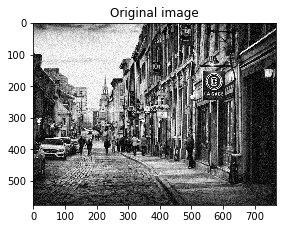

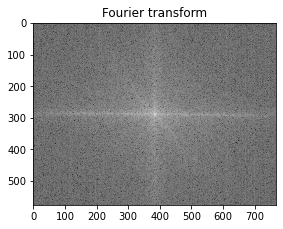

In [68]:
# TODO: you know what to do! (right?)
from scipy import fftpack 
from matplotlib.colors import LogNorm

f = fftpack.fft2(city_noisy.astype(np.float)) # This will compute the Fourier transform 
f = fftpack.fftshift(f)

#Original image
fig = plt.figure(figsize = (20,20))
ax1 = fig.add_subplot(141)
ax1.imshow(city_noisy, interpolation = 'none', cmap = 'gray')
ax1.set_title('Original image')

#Filter image
fig = plt.figure(figsize = (20,20))
ax2 = fig.add_subplot(142)
ax2.imshow(np.abs(f), interpolation = 'none', cmap = 'gray', norm = LogNorm(vmin = 15))
ax2.set_title('Fourier transform')

This exercise was based on Amal Lahiani's exercise. 

Text(0.5, 1.0, 'Inverse Fourier image')

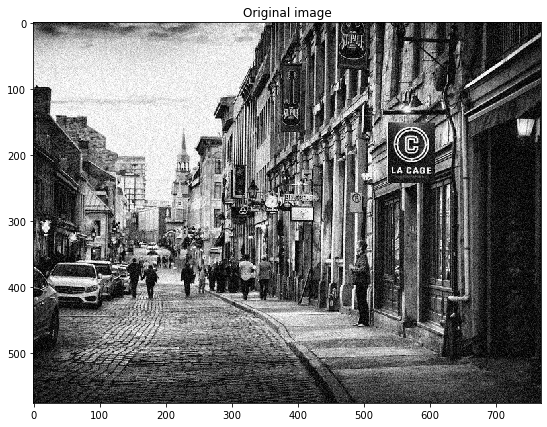

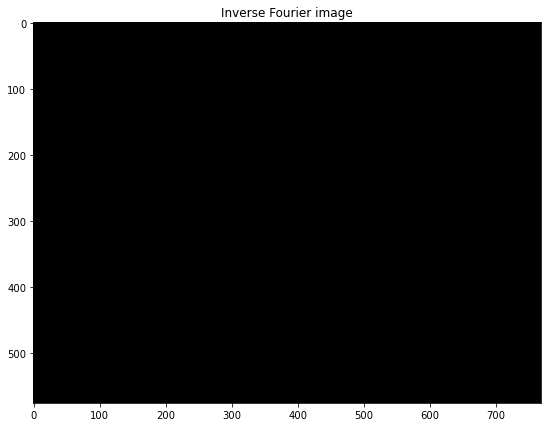

In [75]:
r,c = city_noisy.shape

cy, cx = r // 2, c //2
# We are going to do this because we want to keep only the frequencies in the center. 
#That's why we multiply by the circle
mask = np.zeros(shape = city_noisy.shape)
cv2.circle(mask, center = (cx, cy), radius = 150, color = 1, thickness = -1)

f*= mask

f = fftpack.fftshift(f)
spectral_filtered = fftpack.ifft2(f).real #We take only the real part of the Fourier transdorm 

#Original image
fig = plt.figure(figsize = (20,20))
ax1 = fig.add_subplot(121)
ax1.imshow(city_noisy, interpolation = 'none', cmap = 'gray')
ax1.set_title('Original image')

#Inverse Fourier image
fig = plt.figure(figsize = (20,20))
ax2 = fig.add_subplot(122)
ax2.imshow(spectral_filtered, interpolation = 'none', cmap = 'gray')
ax2.set_title('Inverse Fourier image')